In [12]:
cd((@__DIR__) * raw"\..")
include("../table_reader.jl")

extract_series (generic function with 1 method)

In [13]:
series=extract_series("TX_STAID000031.txt",plot=false)
years=unique(Dates.year.(series.DATE))

include("../utils/Simulation.jl")
Days_list=GatherYearScenario(series[!,2],series.DATE)
avg_day=mean.(Days_list)
max_day=maximum.(Days_list)
df_month = @chain series begin
    @transform(:TEMP = series[!,2]) #Give a common name for TX, TN, etc...
    @transform(:MONTH = month.(:DATE)) #add month column
    @by(:MONTH, :MONTHLY_MEAN = mean(:TEMP), :MONTHLY_STD = std(:TEMP), :MONTHLY_MAX = maximum(:TEMP)) # grouby MONTH + takes the mean/std in each category 
end

#Imputing missing values
# include("utils/Missing_values.jl")
# ImputeMissingValues!(series[!,2],series.DATE)
# N=length(series[!,2])

Row,MONTH,MONTHLY_MEAN,MONTHLY_STD,MONTHLY_MAX
,Int64,Float64,Float64,Float64
1,1,11.4608,3.35493,21.2
2,2,12.6576,3.45266,22.7
3,3,15.3331,3.15435,26.1
4,4,18.1409,3.08704,28.5
5,5,22.1839,3.35553,33.2
6,6,25.7999,3.08702,36.9
7,7,28.5384,2.88103,40.6
8,8,28.0754,2.74896,38.6
9,9,24.7867,2.93797,33.8


## I. Series filtered by removing a trigonometric periodicity

In [14]:
include("../utils/periodicity.jl")
trigo_function=fitted_periodicity_fonc(series[!,2],series.DATE,OrderTrig=2)
periodicity=trigo_function.(series.DATE)
x=series[!,2]-periodicity
period=trigo_function.(Date(0):Date(1)-Day(1))

366-element Vector{Float64}:
 11.430095756870898
 11.412321166544466
 11.397023769107946
 11.384179904737286
 11.373765148360201
 11.365754350293232
 11.36012167710008
 11.356840652619576
 11.35588419911158
 11.35722467846927
  ⋮
 11.673710095265296
 11.634730890890877
 11.598389584168638
 11.564670322876855
 11.53355616968981
 11.50502913904831
 11.47907023466868
 11.455659487640984
 11.434775995066737

## Segmenting the dataset by month

In [15]:
include("../utils/Separation.jl")
Monthly_date=MonthlySeparateDates(series.DATE)
Monthly_temp=MonthlySeparateX(x,series.DATE)

12-element Vector{Vector{AbstractVector}}:
 [[0.16990424312910157, 0.887678833455535, 1.6029762308920539, -1.1841799047372863, 2.626234851639799, 0.23424564970676798, 4.13987832289992, 3.7431593473804234, 3.344115800888419, 4.44277532153073  …  -2.5418252313022904, -9.070330272658365, -11.600709275688784, -7.832931032441265, -1.2669644020527766, -0.8027783455378845, -6.64034195979186, -6.679624510768978, -4.320595465797927, -5.863224524997108], [-0.13009575687089736, 0.9876788334555346, 4.302976230892053, 2.715820095262714, 2.526234851639799, 0.8342456497067676, 1.03987832289992, 1.4431593473804245, 1.0441158008884202, 1.7427753215307291  …  2.4581747686977096, 4.529669727341636, 0.5992907243112153, 3.867068967558735, 0.833035597947223, 0.9972216544621144, 3.0596580402081415, 0.9203754892310219, -1.120595465797928, 4.136775475002892], [-1.6300957568708974, 3.7876788334555336, -2.2970237691079465, 0.41582009526271513, 4.326234851639798, 4.034245649706769, 2.7398783228999193, 2.943159347

## Autocorrelations

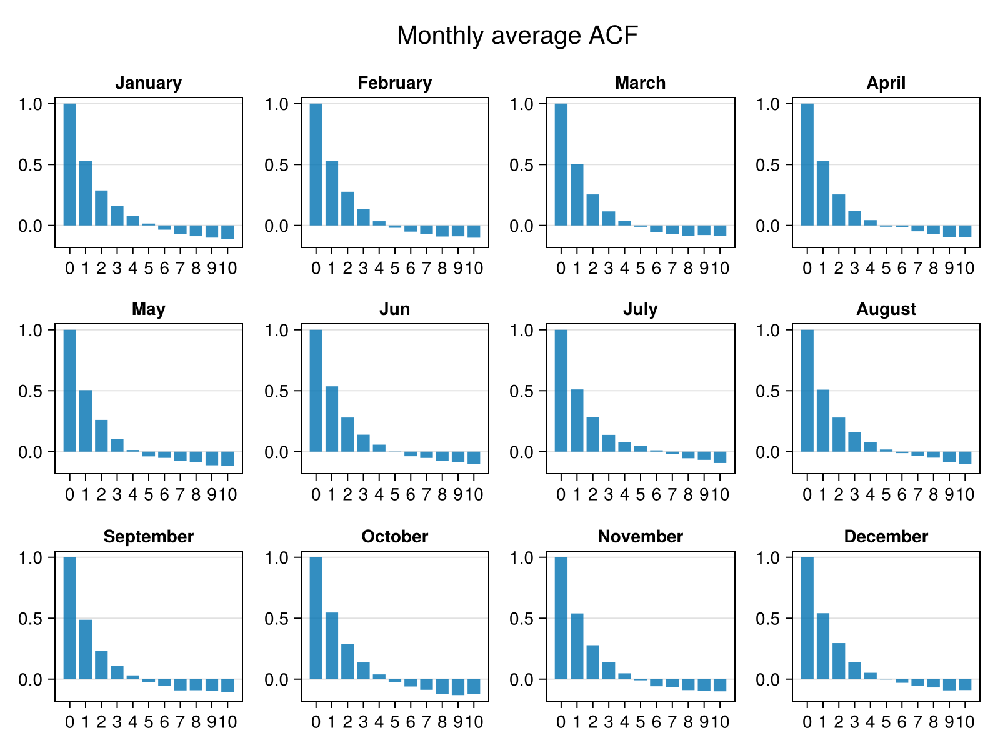

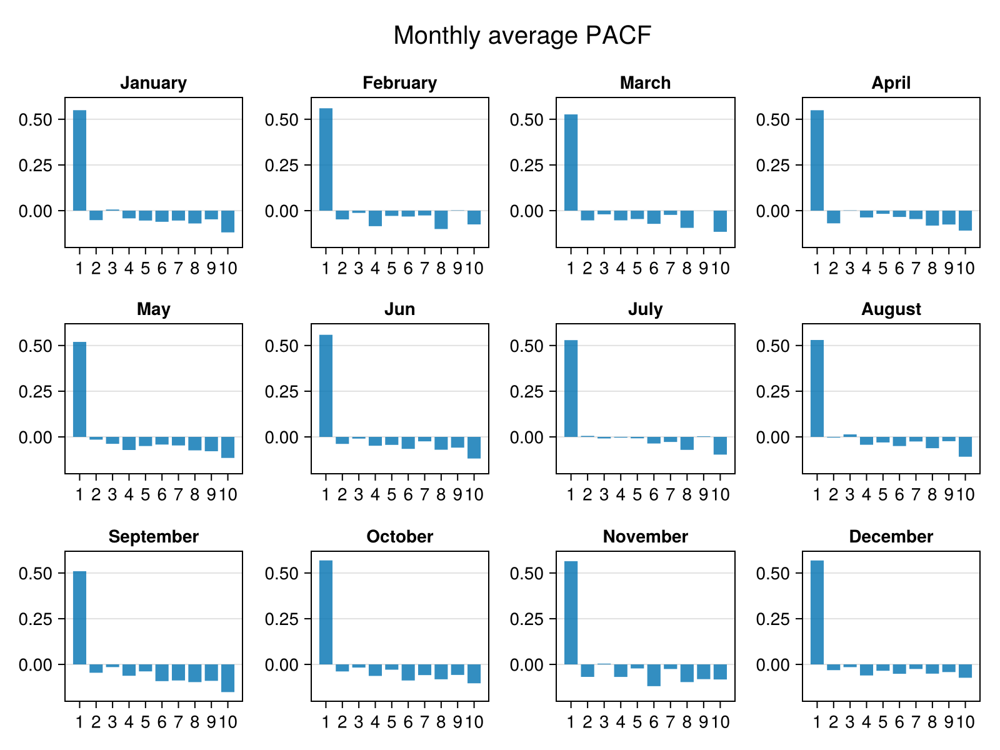

CairoMakie.Screen{IMAGE}


In [16]:
include("../utils/ACF_PACF.jl")
display(MonthlyACF(Monthly_temp))
display(MonthlyPACF(Monthly_temp))

For each month, it still looks like an AR(1) model

# Estimation AR(1)

## Estimation

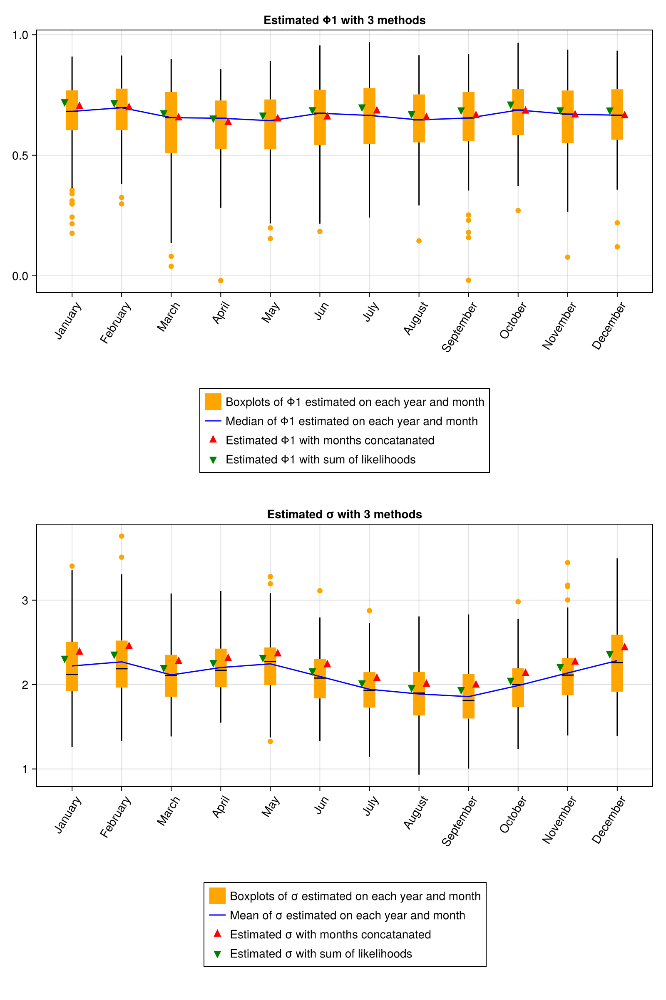

CairoMakie.Screen{IMAGE}


In [17]:
include(raw"..\utils\Estimation.jl")
Params, figure= AllEstimation(Monthly_temp, lineplot=true)
display(figure)

## Simulation

### With estimation on each month

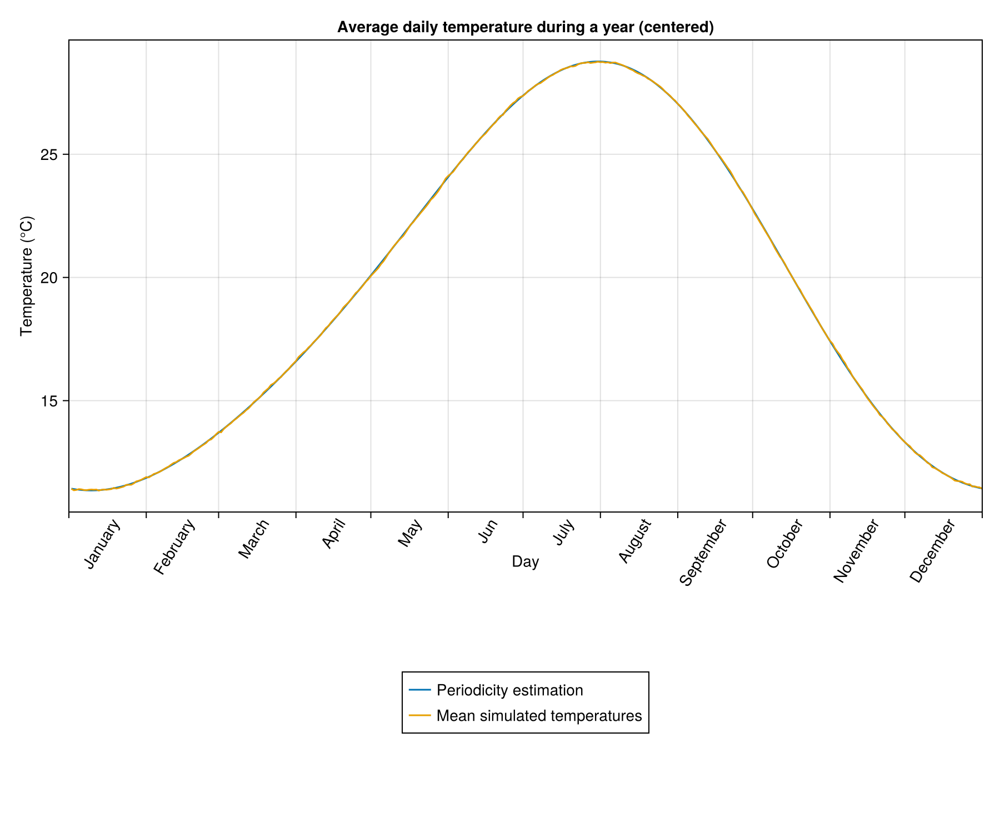

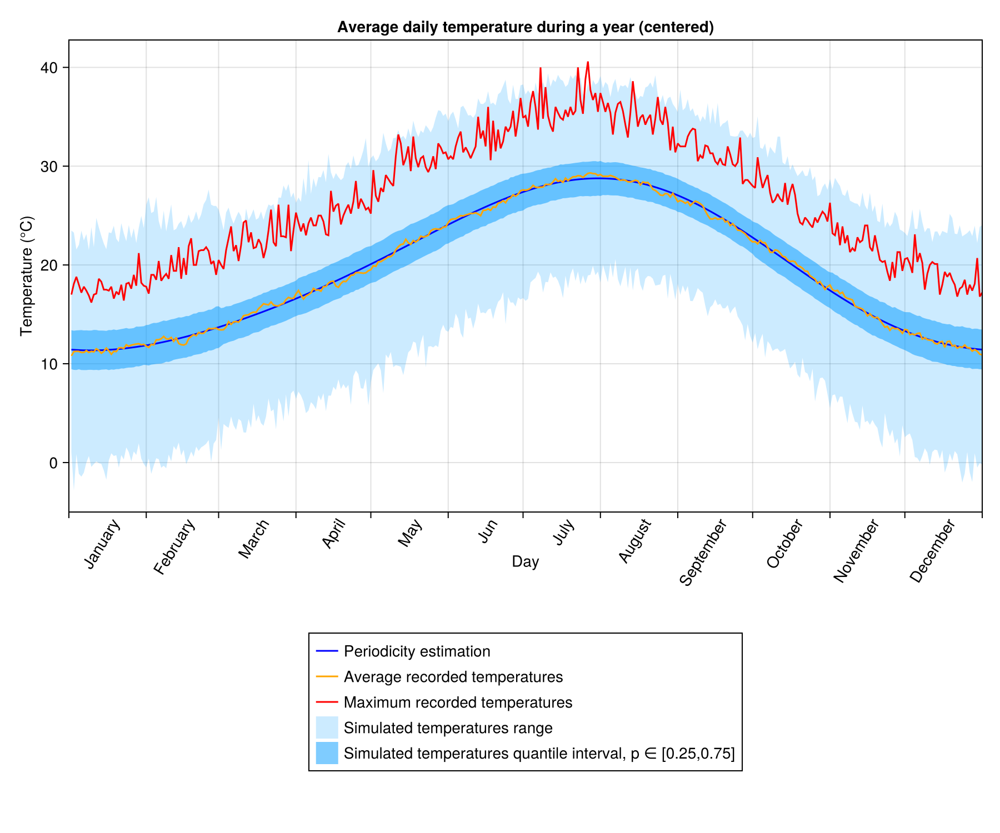

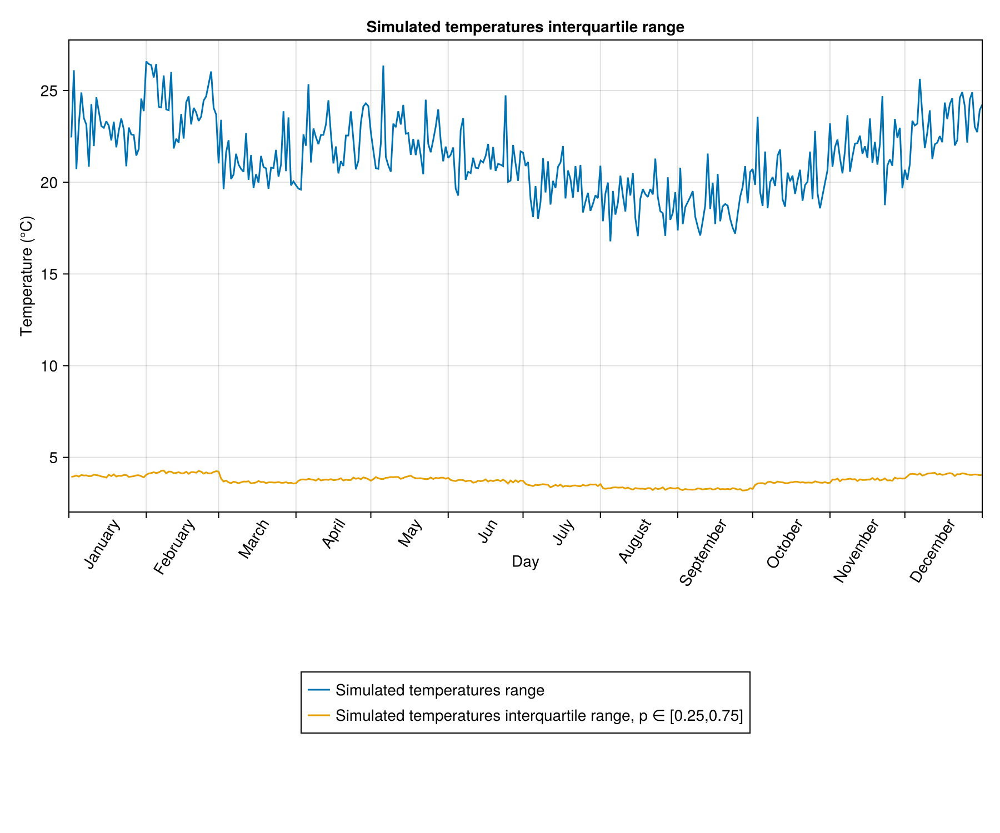

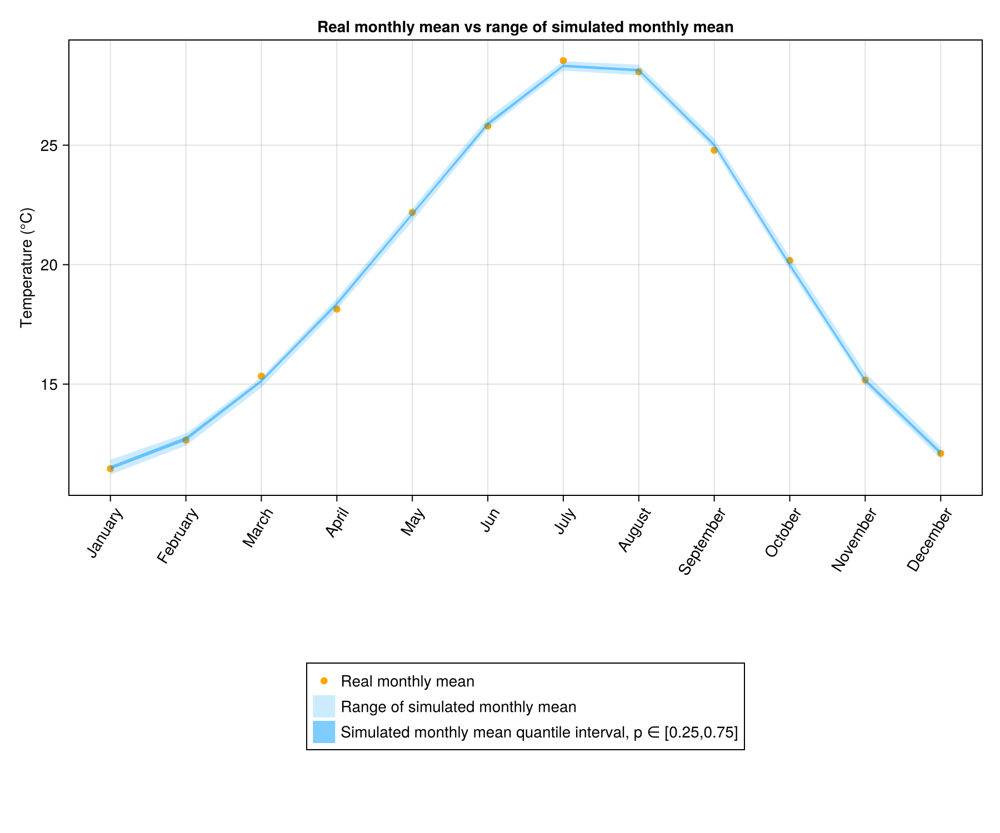

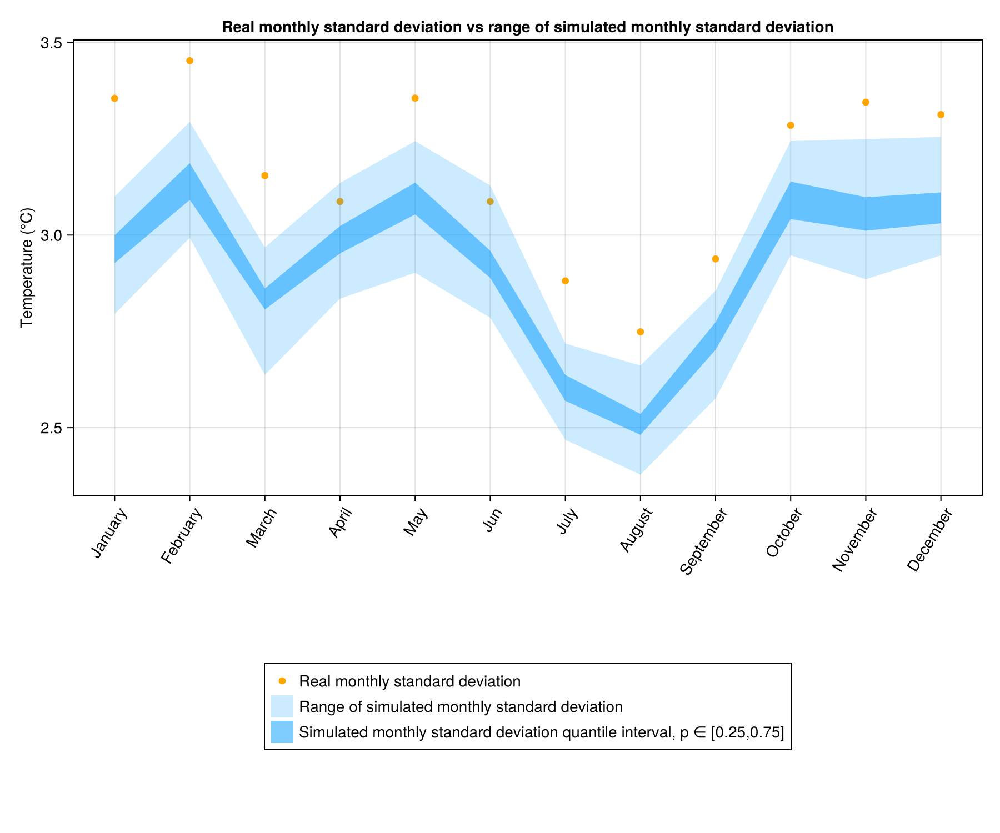

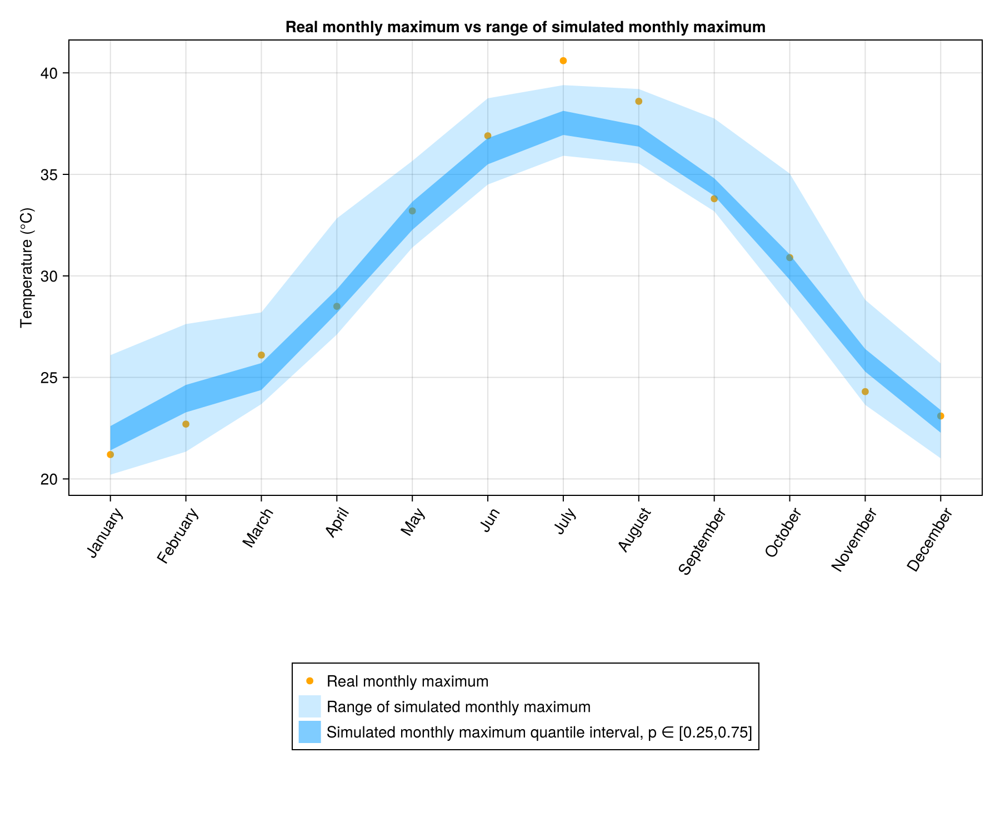

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x000002e483964e60, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000002

In [18]:
include("../utils/Simulation.jl")
include("../utils/Plotting.jl")
Φ_month_mean,σ_month_mean=TakeParameters(Params,"mean")
sample_ = SimulateScenarios(Monthly_temp[1][1][1],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))

We see clearly that interquartile range is shorter during summer and larger during winter.

### With months concatanation

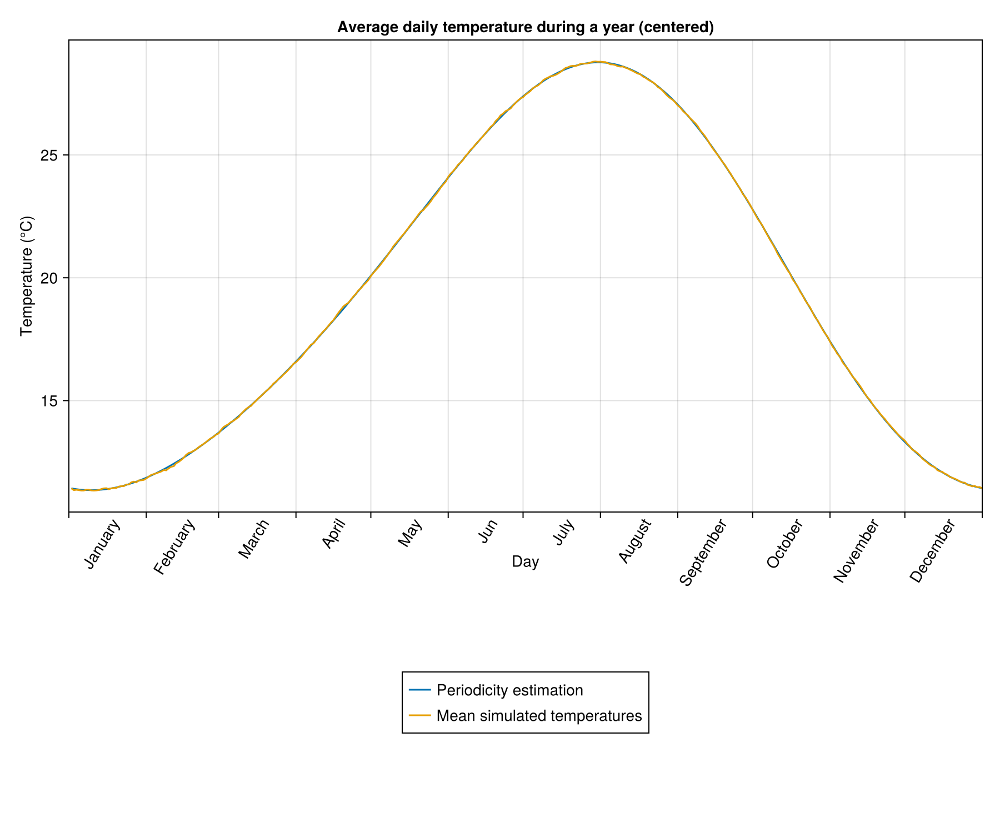

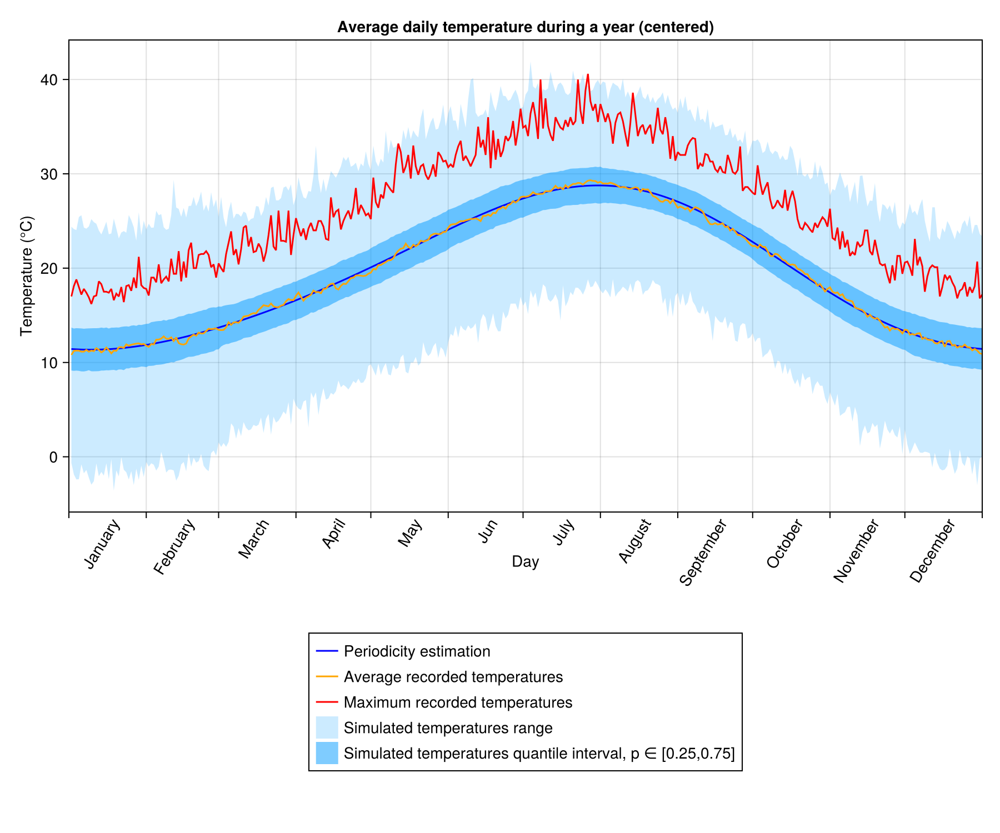

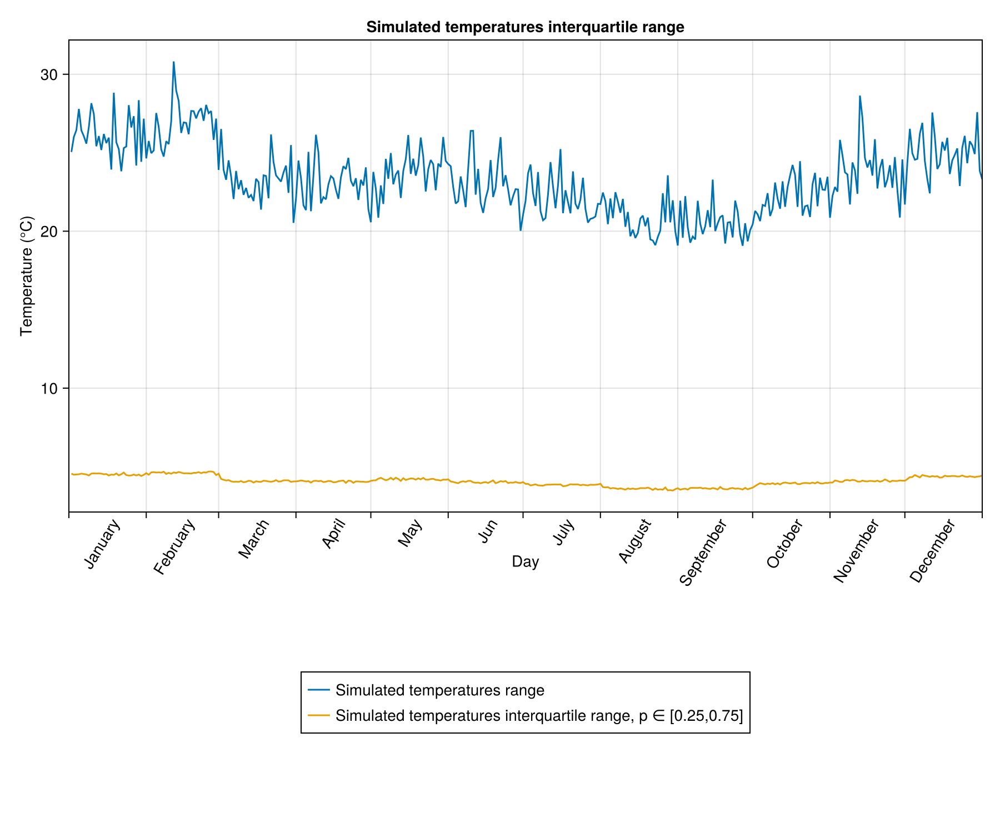

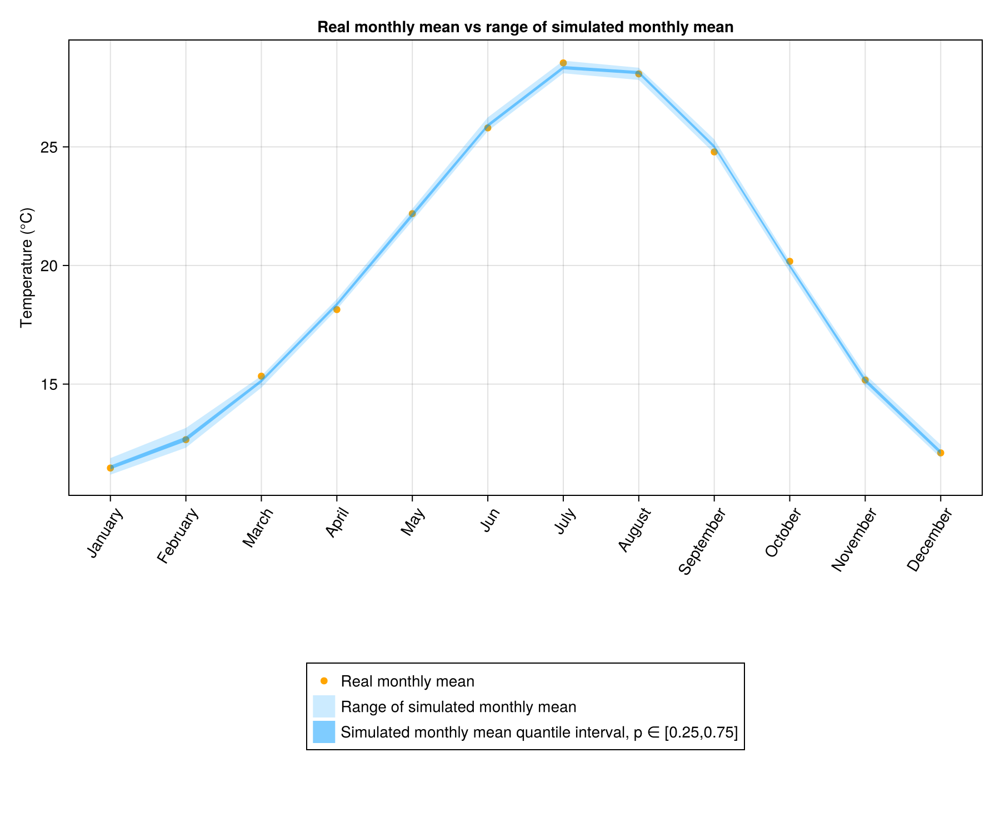

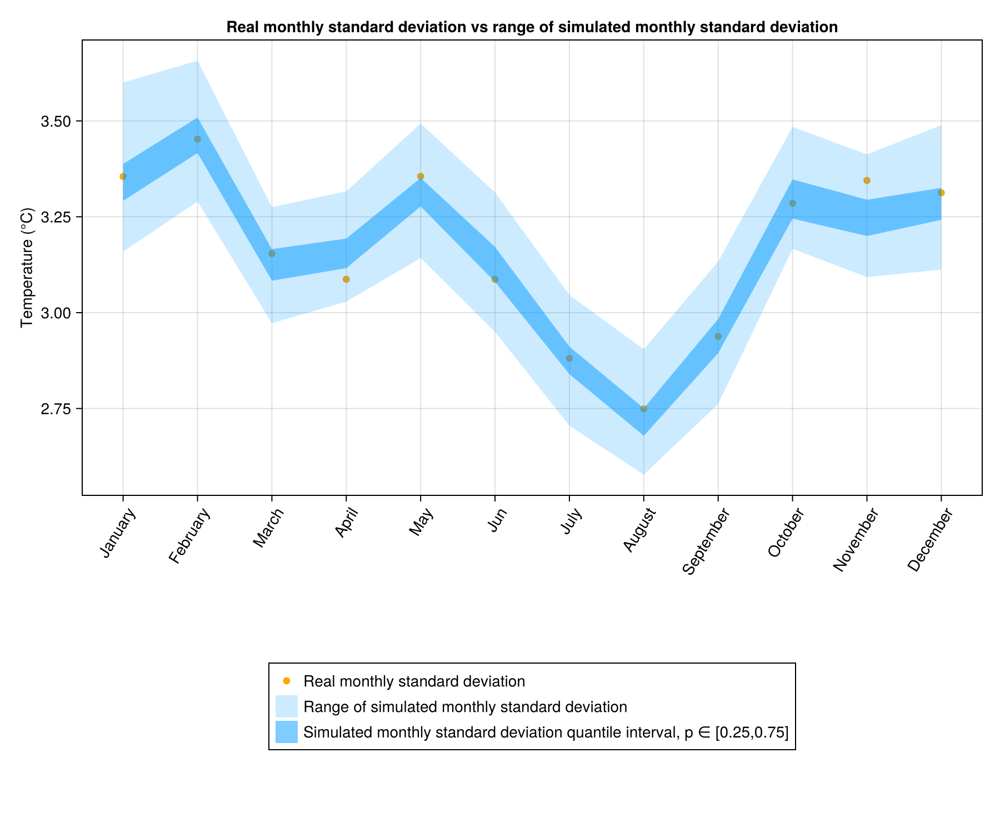

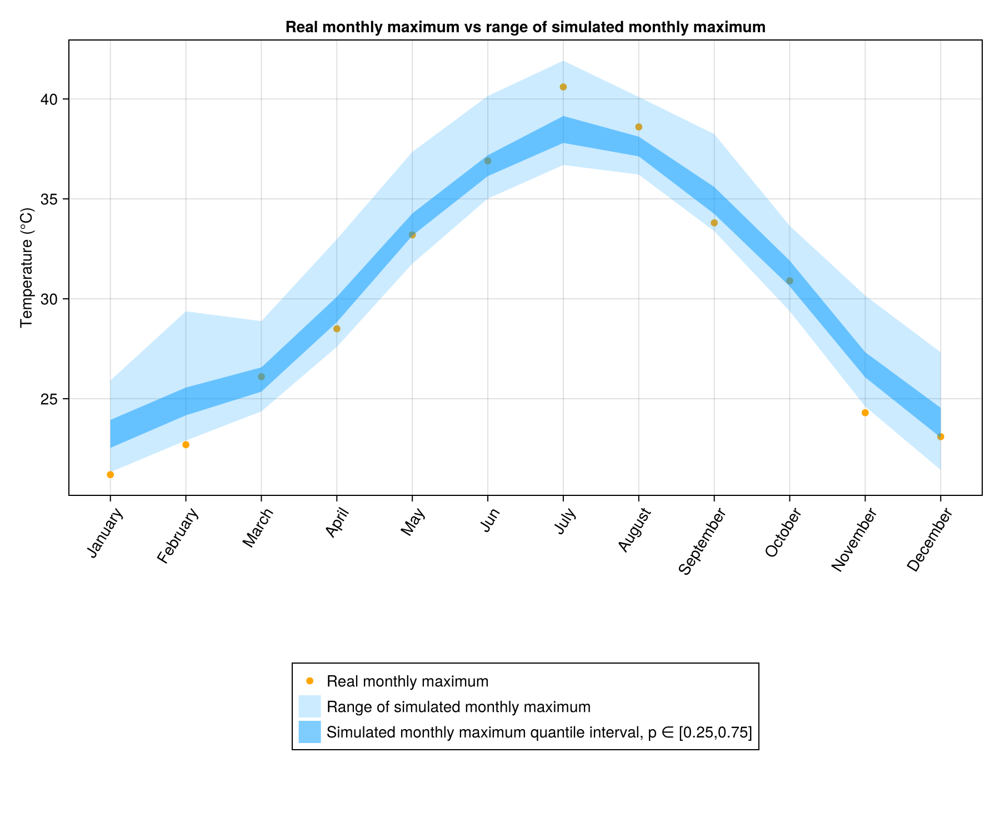

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x000002e48396e4e0, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000002

In [19]:
Φ_month_mean,σ_month_mean=TakeParameters(Params,"concat")
sample_ = SimulateScenarios(Monthly_temp[1][1][1],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end]) 
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))

### With sum of likelihoods

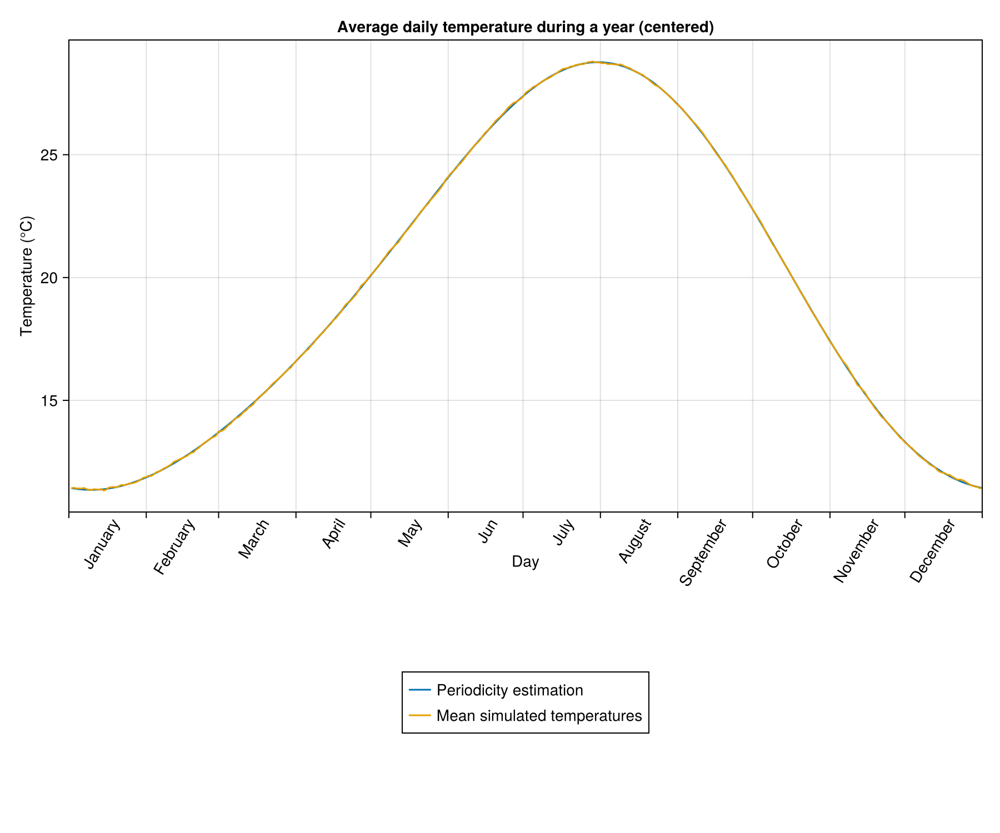

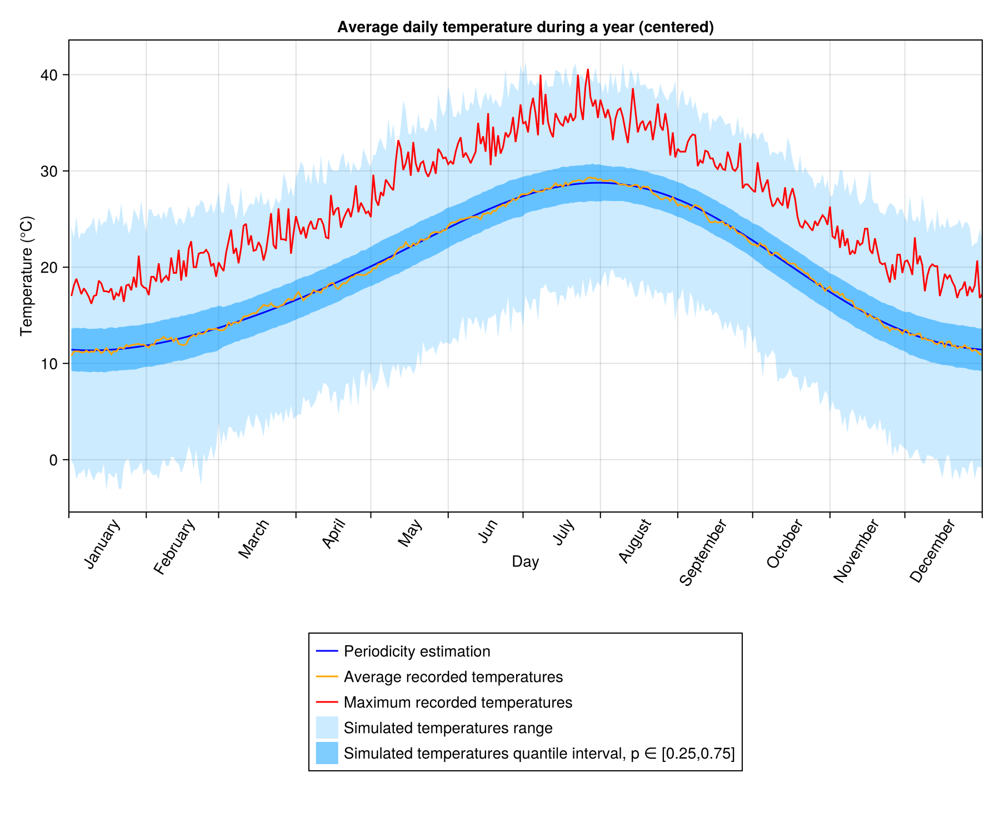

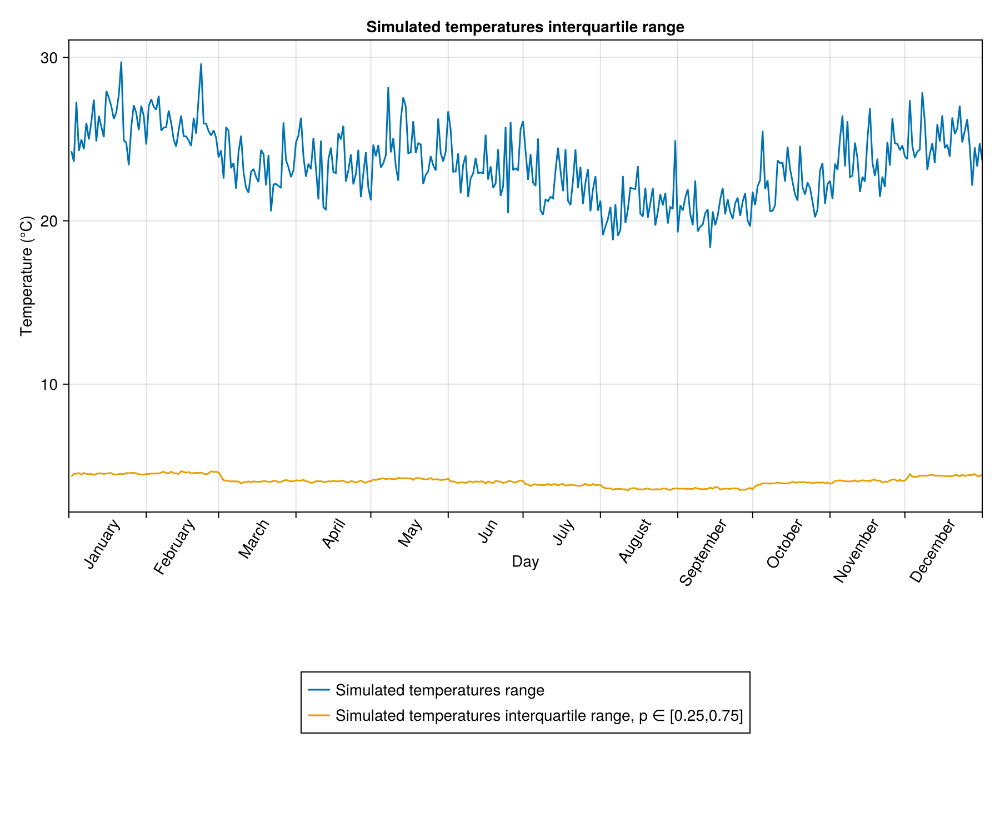

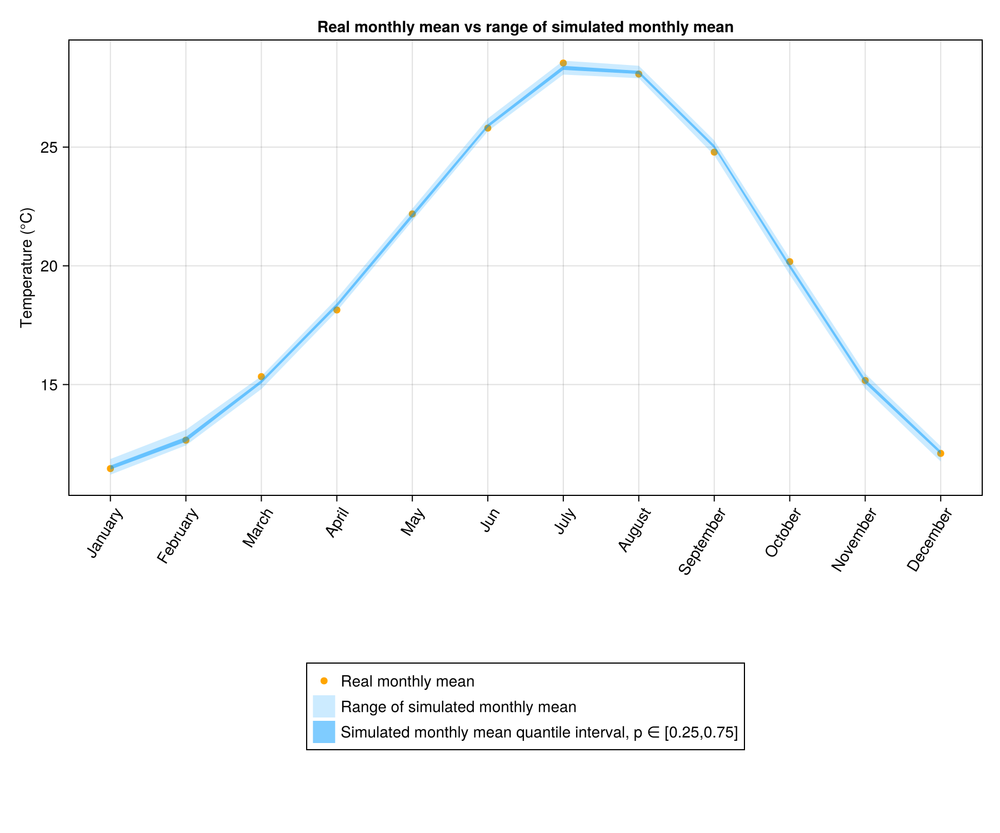

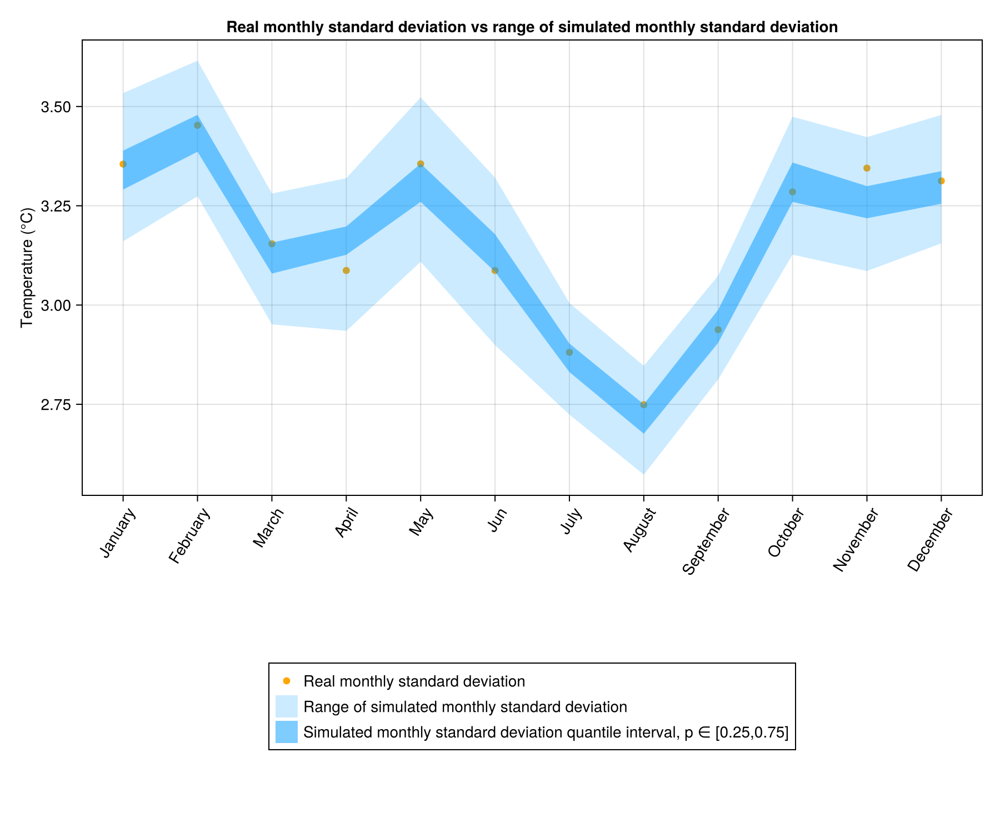

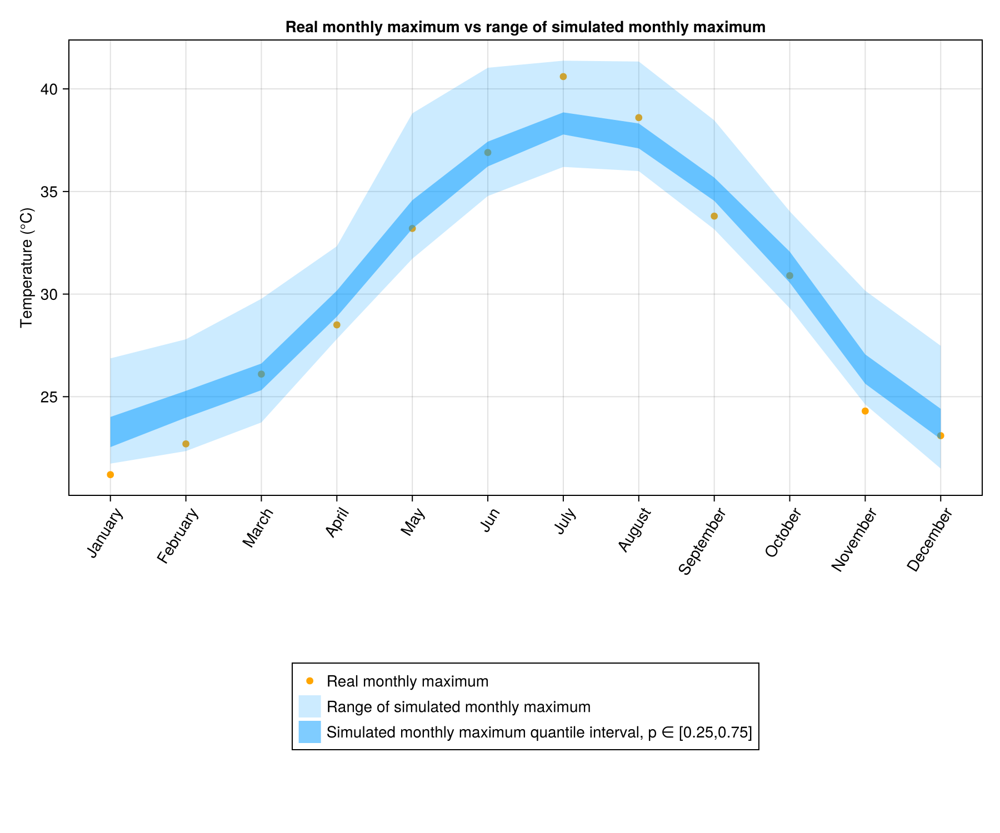

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x000002e483971960, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000002

In [20]:
Φ_month_mean,σ_month_mean=TakeParameters(Params,"sumLL")
sample_ = SimulateScenarios(Monthly_temp[1][1][1],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))

# Estimation AR(2)

## Estimation

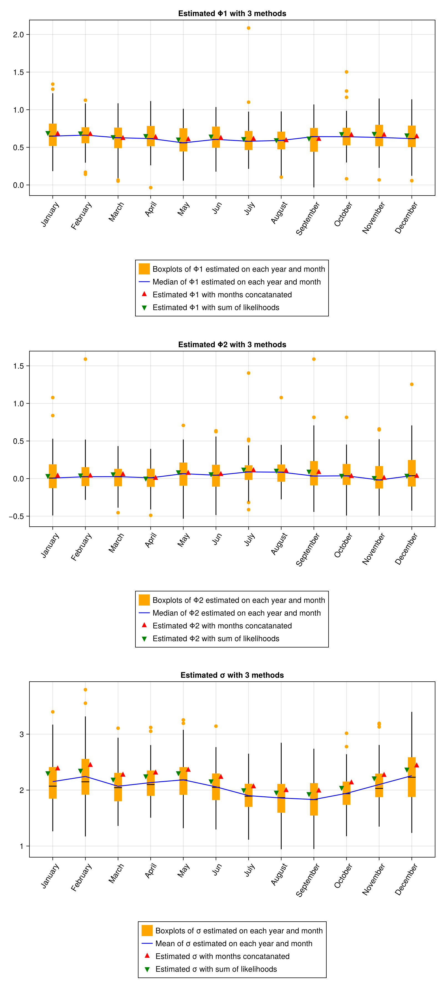

CairoMakie.Screen{IMAGE}


In [21]:
include("../utils/Estimation.jl")
Params, figure= AllEstimation(Monthly_temp, 2, lineplot=true)
display(figure)

### Estimation and simulation with sum of likelihoods

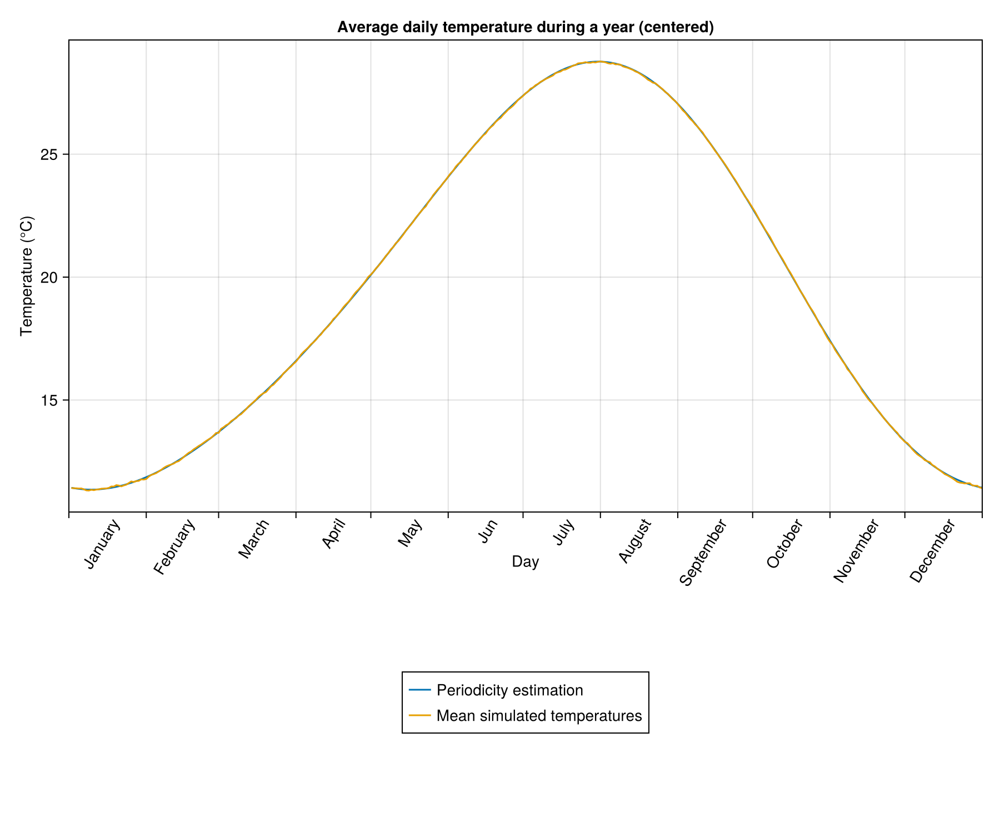

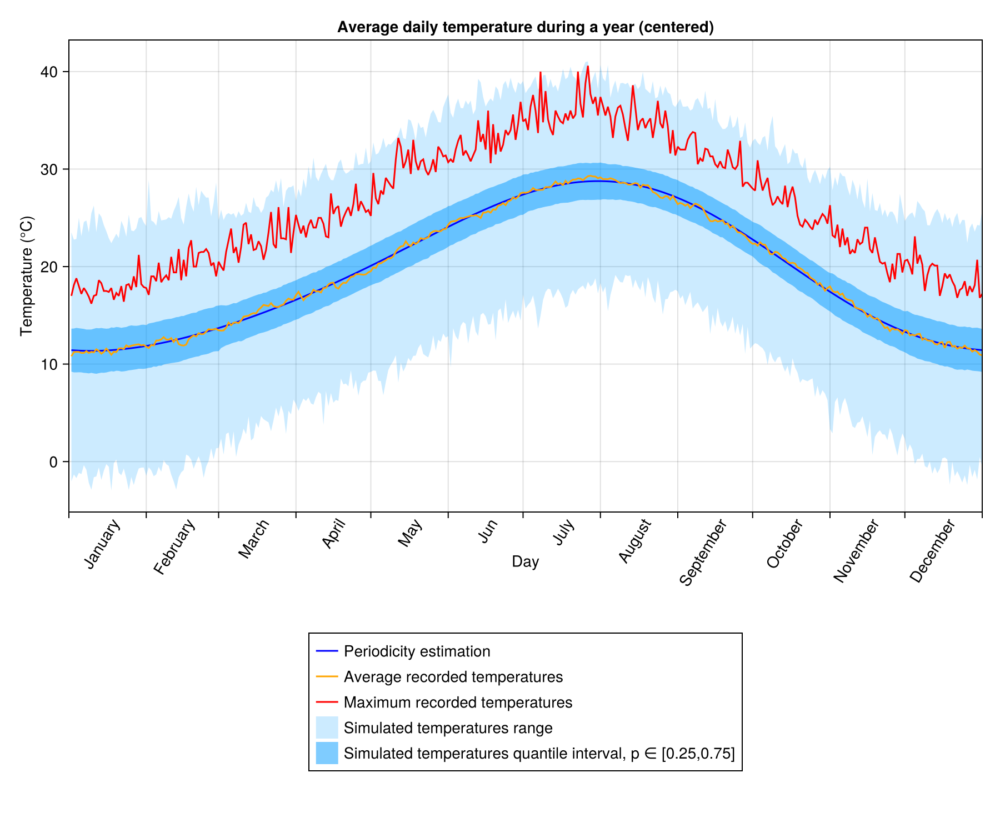

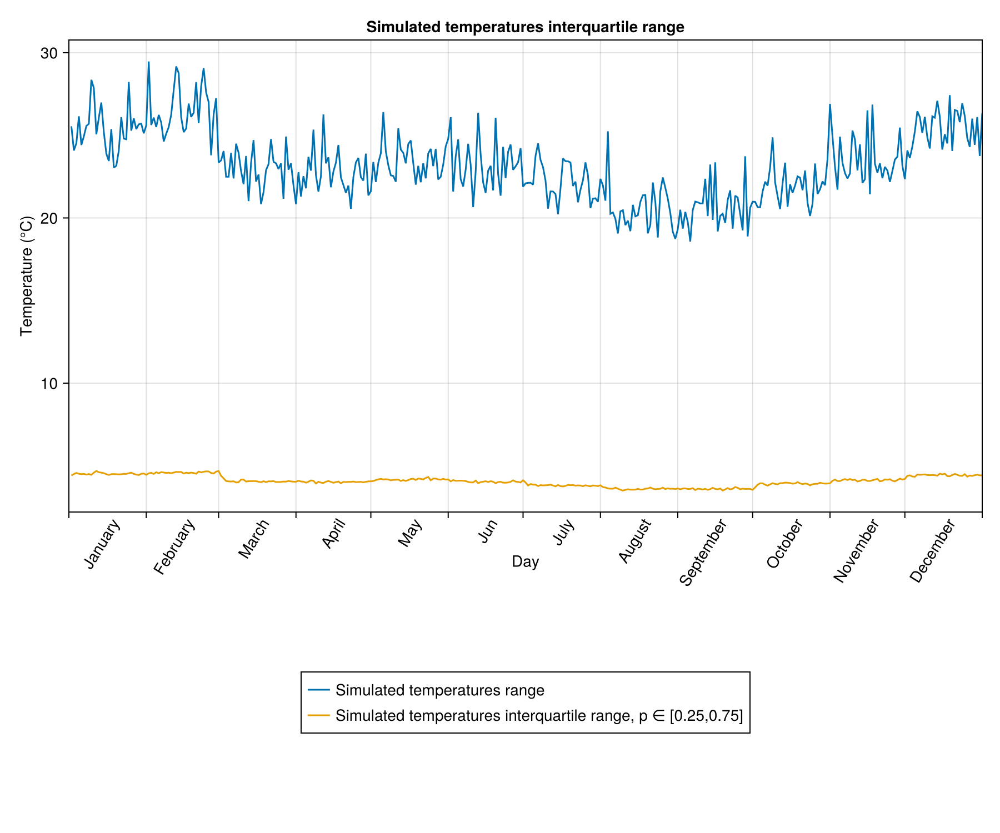

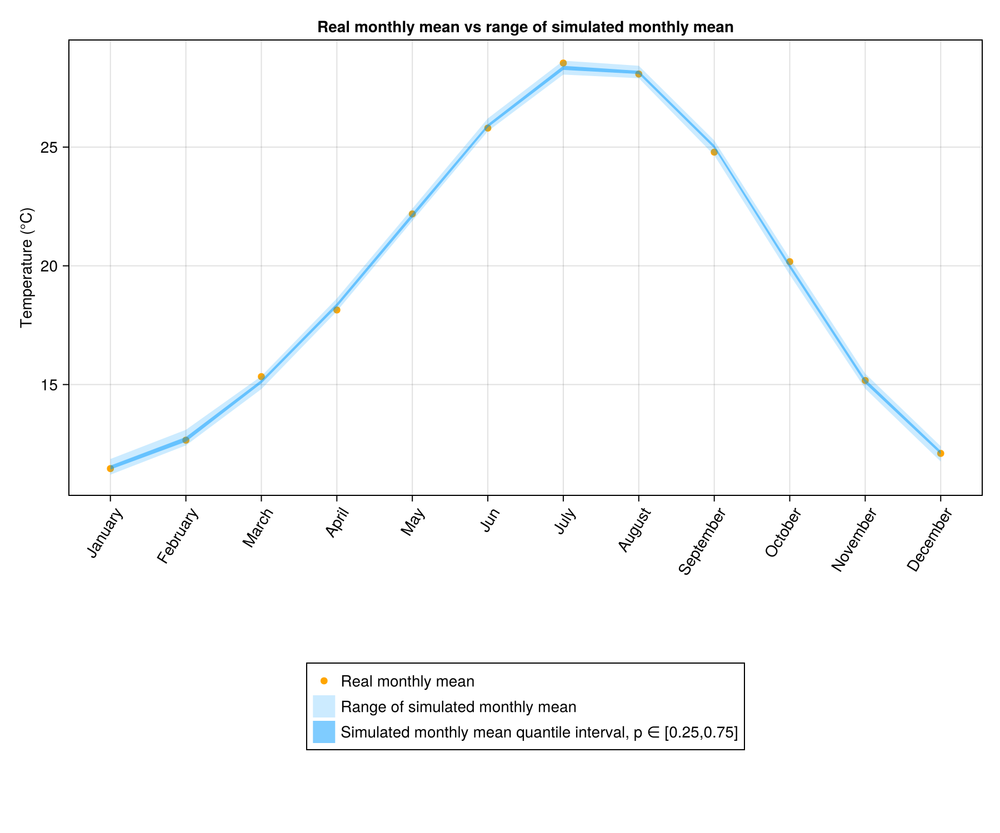

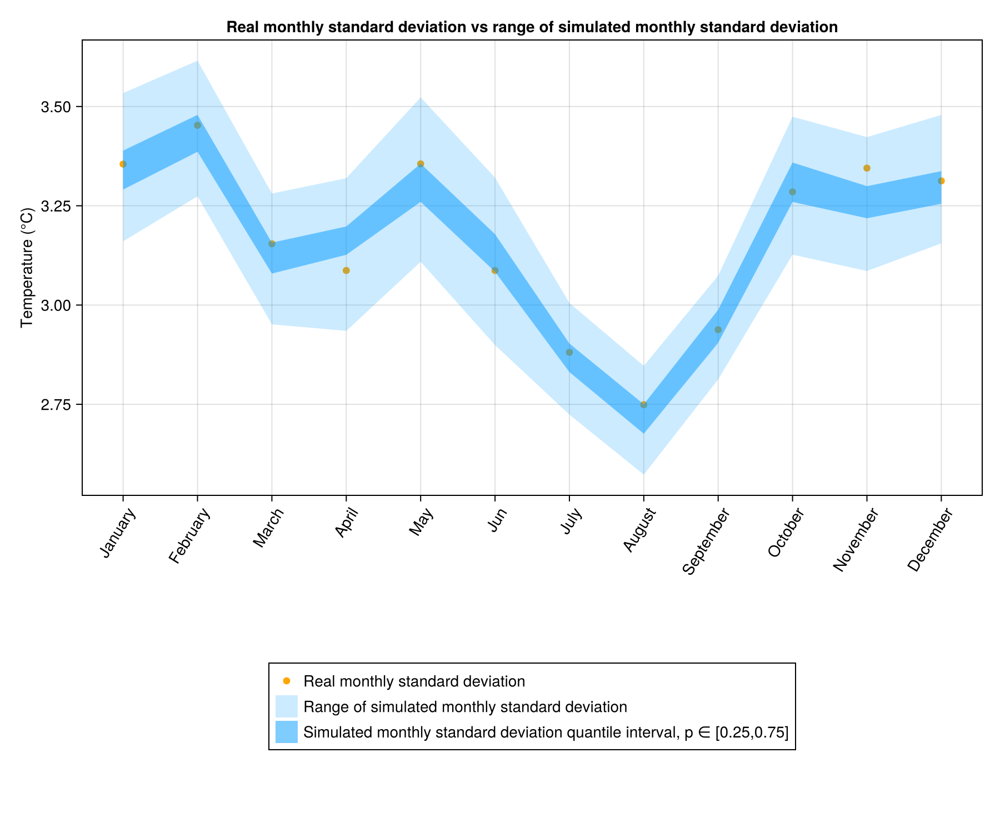

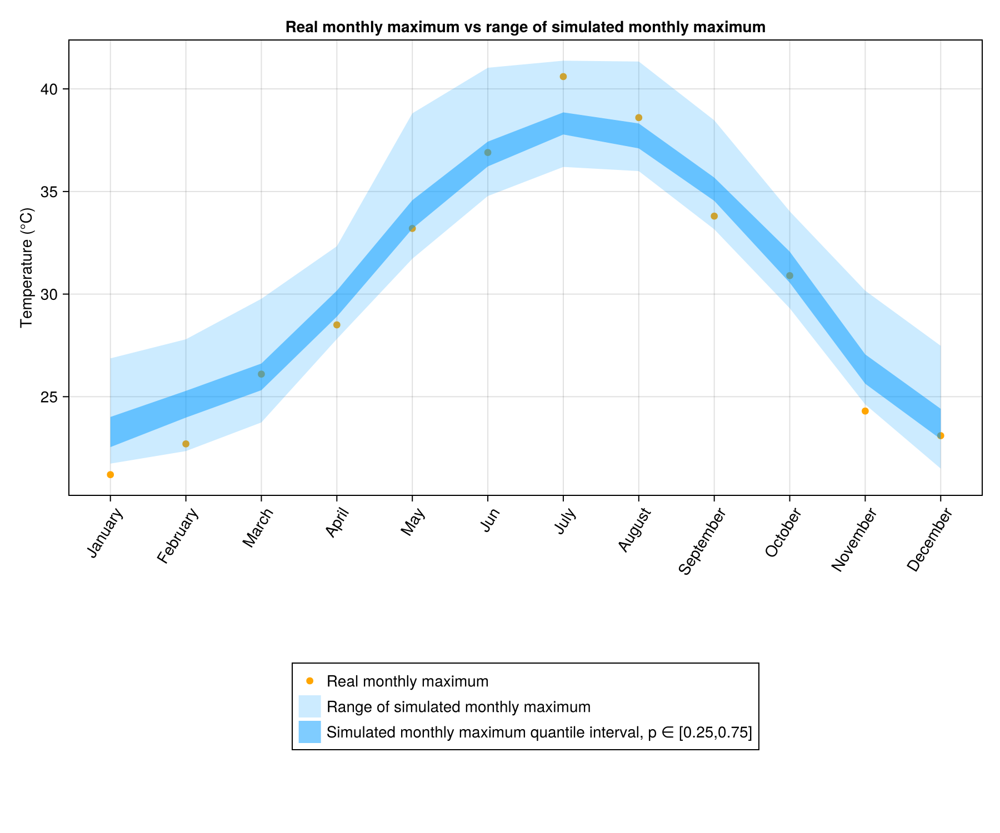

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x000002e466b0d240, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000002

In [22]:
Φ_month_mean,σ_month_mean=TakeParameters(Params,"sumLL")
year_sample = GatherYearScenarios(SimulateScenarios(Monthly_temp[1][1][1:2],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100),series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))